Author: Michael Gygli ([Github](https://github.com/gyglim), [Twitter](https://twitter.com/GygliMichael)), 2016-06-21
## Introduction
This example demonstrates how to generate GIFs from automatically determined video highlights.
To find highlights, we trained a deep neural network to rank segments of videos using the video2gif dataset (https://github.com/gyglim/video2gif_dataset). Our work is described in more depth in our research paper [1].

The model uses C3D convolutional features [2] as input and is implemented in Lasagne and Theano. 

[1]: M. Gygli, Y. Song, L. Cao - Video2GIF: Automatic Generation of Animated GIFs from Video. CVPR 2016 https://people.ee.ethz.ch/~gyglim/video2gif_cvp16.pdf

[2]: D. Tran, L. Bourdev, R. Fergus, L. Torresani, and M. Paluri, Learning Spatiotemporal Features with 3D Convolutional Networks, ICCV 2015, http://vlg.cs.dartmouth.edu/c3d/c3d_video.pdf

### Preparation steps
Please install the video2gif package first, using

    python setup.py install

In [1]:
''' We start by downloading the necessary data '''
# Download the weights and mean for C3D
!wget https://data.vision.ee.ethz.ch/gyglim/C3D/c3d_model.pkl -P ./data -nc
!wget https://data.vision.ee.ethz.ch/gyglim/C3D/snipplet_mean.npy -P ./data -nc

# Get the video2gif weights
!wget https://data.vision.ee.ethz.ch/cvl/video2gif/model/video2gif_weights.npz  -P ./data -nc
    
# Finally, we also get an example video
!wget https://data.vision.ee.ethz.ch/cvl/video2gif/nWHIHe-rjoU.mp4 -P ./data -nc

File ‘./data/c3d_model.pkl’ already there; not retrieving.

File ‘./data/snipplet_mean.npy’ already there; not retrieving.

File ‘./data/video2gif_weights.npz’ already there; not retrieving.

File ‘./data/nWHIHe-rjoU.mp4’ already there; not retrieving.



In [8]:
# Import the video2gif package
import video2gif

In [3]:
'''
Compile the score function
On the GPU, the network will be using cuDNN layer implementations available in the Lasagne master

If the device is CPU, it will use the CPU version that requires my Lasagne fork with added 3D convolution and pooling.
You can get it from https://github.com/gyglim/Lasagne

'''

score_function = video2gif.get_prediction_function()

Load weights and compile model...
Use fast network implementation (cuDNN)
Load pretrained weights from data/c3d_model.pkl...
Load pretrained autogif_demo weights from data/video2gif_weights.npz...
Set the weights...


In [4]:
# Import needed modules
from IPython.display import Image, display
import os
from moviepy.editor import VideoFileClip

In [5]:
'''
Now, let's generate generate some GIFs.
For this we create uniform segment of 5 seconds, score them and
finally generate GIFs from the top and bottom scored ones
'''

# Take the example video
video_path='data/nWHIHe-rjoU.mp4'
video_name=os.path.splitext(os.path.split(video_path)[1])[0]
video = VideoFileClip(video_path)

# Build segments (uniformly of 5 seconds)
segments = [(start, int(start+video.fps*5)) for start in range(0,int(video.duration*video.fps),int(video.fps*5))]

# Score the segments
scores=video2gif.get_scores(score_function, segments, video, stride=8)        

Score segments...
Extracting scores for 52 segments took 215.533s



[MoviePy] Building file /tmp/gifs/nWHIHe-rjoU_00.gif with imageio


 98%|█████████▊| 50/51 [00:00<00:00, 63.87it/s]



[MoviePy] Building file /tmp/gifs/nWHIHe-rjoU_01.gif with imageio


 98%|█████████▊| 50/51 [00:00<00:00, 63.63it/s]



[MoviePy] Building file /tmp/gifs/nWHIHe-rjoU_02.gif with imageio


 98%|█████████▊| 50/51 [00:00<00:00, 60.78it/s]



[MoviePy] Building file /tmp/gifs/nWHIHe-rjoU_52.gif with imageio


 98%|█████████▊| 50/51 [00:00<00:00, 58.71it/s]



[MoviePy] Building file /tmp/gifs/nWHIHe-rjoU_51.gif with imageio


 98%|█████████▊| 50/51 [00:00<00:00, 60.39it/s]



[MoviePy] Building file /tmp/gifs/nWHIHe-rjoU_50.gif with imageio


 98%|█████████▊| 50/51 [00:00<00:00, 60.25it/s]


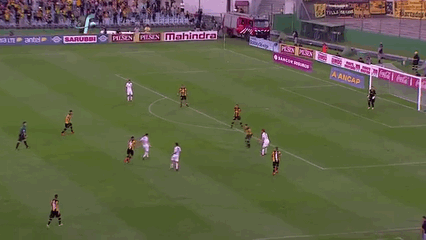

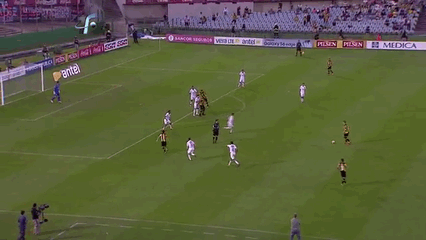

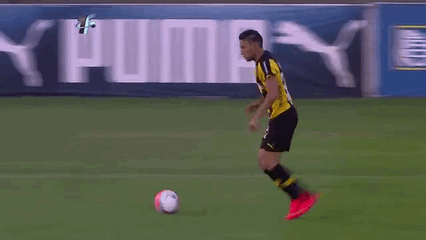

In [6]:
'''
Now we generate GIFs for some segments and show them
'''

# We need a directory to store the GIFs
OUT_DIR='/tmp/gifs'
if not os.path.exists(OUT_DIR):
    os.mkdir(OUT_DIR)

# Generate GIFs from the top scoring segments
good_gifs,bad_gifs = video2gif.generate_gifs(OUT_DIR,scores, video, video_name,top_k=3,bottom_k=3)

# Show them in the jupyter notebook
for gif_data in good_gifs: # Top GIFs
    gif_data[1]
    gif_path='%s/%s_%.2d.gif' % (OUT_DIR,video_name,gif_data[1])
    with open(gif_path,'rb') as f:
        display(Image(f.read()), format='png')

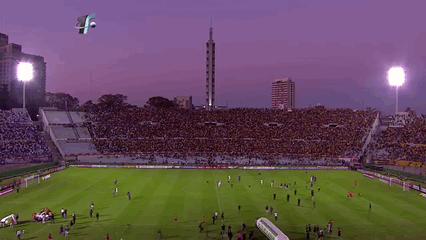

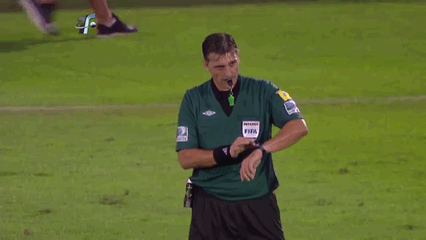

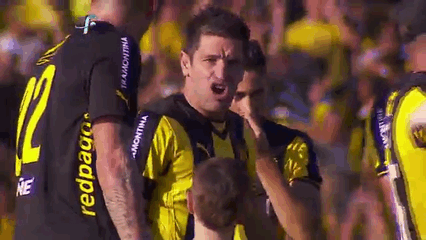

In [7]:
# Now, for comparison, we show the GIFs with the worst scores
for gif_data in bad_gifs: 
    gif_data[1]
    gif_path='%s/%s_%.2d.gif' % (OUT_DIR,video_name,gif_data[1])
    with open(gif_path,'rb') as f:
        display(Image(f.read()), format='png')



In [ ]:
'''
    Evaluation on the video2gif dataset
    This section is about how to rerun the evaluation on the video2gif dataset.
    For this you need need to download it first, from:
        https://github.com/gyglim/video2gif_dataset
    
    WARNING: Evaluating will take several hours even on the GPU.
    It's probably not a good idea to do it on the CPU
'''

# Import needed packages
import pandas as pd
import numpy as np
import sys
import tqdm

# Add evaluation to path and import it
dataset_dir=video2gif.config.get('paths','dataset_dir')
sys.path.insert(0,'%s/evaluation/' % dataset_dir)
import evaluation
video_directory=video2gif.config.get('paths','video_directory')

# Read csv file using pandas
#For more info on pandas check http://pandas.pydata.org/pandas-docs/stable/10min.html
dataset=pd.read_csv('%s/metadata.txt' % dataset_dir,sep=';\t',engine='python')

# Read test IDs
with open('%s/testset.txt' % dataset_dir,'r') as f:
    test_ids=[l.rstrip('\n') for l in f]
    
def evaluate_cvpr16():
    '''
     This function evalutes the model described in our paper at CVPR 2016
     We provide the model with C3D input only (no context features), as it is more general
     
     ------
     NOTE: You get slightly different results
     This is due to 3 reasons:
     1. Different segmentation. Uniform instead of change point detection.
        In practice, of course, change-point detection is prefered, as it respects shot boundaires, etc.
     2. In the paper we did mean pooling for the C3D features over a segment. 
        Here we do mean pooling of the predicted scores
     3. Some tiny differences in the C3D features, see: 
        https://github.com/gyglim/Recipes/blob/master/examples/Video%20features%20with%20C3D.ipynb
     ---
    '''
    sys.stdout.write('''Evaluate video2gif network performance''')
    sys.stdout.flush()
    all_ap=np.zeros(len(test_ids))
    all_msd=np.zeros(len(test_ids))
    for idx,youtube_id in tqdm.tqdm(enumerate(test_ids)):
        y_gt=evaluation.get_gt_score(youtube_id,dataset)
        y_predicted=-999*np.ones(len(y_gt[0]))
        # Load video
        video = VideoFileClip('%s/%s.mp4' % (video_directory,youtube_id))
        # Build segments (uniformly of 2 seconds)
        segments = [(start, int(start+video.fps*5)) for start in range(0,int(video.duration*video.fps),int(video.fps*5))]
        
        # Score the segments
        scores=video2gif.get_scores(score_function, segments, video, stride=8)        
        for segment,score in scores.items():
            y_predicted[segment[0]:segment[1]]=score

        # Evaluate this video
        all_ap[idx] = evaluation.get_ap(np.array(y_gt).max(axis=0), y_predicted)
        all_msd[idx] = evaluation.meaningful_summary_duration(y_gt,y_predicted)
    print('AP=%.2f%%; MSD=%.2f%%' % (100*np.mean(all_ap),100*np.mean(all_msd)))
    return (100*np.mean(all_ap),100*np.mean(all_msd))

evaluate_cvpr16()